# Urban Growth Analysis Around the Montreal Metropolitan Area with a Focus Around the South Shore From the Year 2016 to 2021 

## Overview of the project and its relevance

Worldwide population is constantly growing. In developped countries like Canada, the most common phenomenon observed is urban growth, as society tends to move towards the cities and away from the countryside. In fact, the Montreal Metropolitan Area has also been a witness to this population movement. According to Statistics Canada, 

Thus, the purpose of this research project, can be described in three main objectives.
- Firstly, the project should analyze census data to evaluate areas with the most population growth in the area of Montreal,  from 2016 to 2021.
- Second, the project will evaluate socioeconomic factors and main drivers within the population where change occured, to explore the profile of the people partaking in this movement of population.
- Thirdly, the project shall visualize urban growth, in various methods, from a statistical analysis of population change.

## Data Collection

## Methodology

In [2]:
import glob
import pandas as pd
import geopandas as gpd
import matplotlib as mpl
import mapclassify
import folium
import contextily

In [3]:
# using glob to establish reading the csv and shp files only
data_filenames = glob.glob('*.[c][s][v]')
shp_filenames = glob.glob('*.[s][h][p]')


In [42]:
# read file of municipalities boundaries in mtl
gdf_muni = gpd.read_file('muni_mtl.geojson')

In [4]:
# using glob to establish reading the shapefiles only for both years
shp2016_filenames = glob.glob('da_boundaries_2016/*.shp')
shp2021_filenames = glob.glob('da_boundaries_2021/*.shp')

In [18]:
gdf_da2016 = gpd.read_file(shp2016_filenames[0])
gdf_da2021 = gpd.read_file(shp2021_filenames[0])

In [41]:
# reading the census data csv file into dataframes for both location and both years
df_lon2016 = pd.read_csv('2016lon_dataDA.csv', sep = ',')
df_lon2021 = pd.read_csv('2021lon_dataDA.csv', sep = ',')
df_mtl2016 = pd.read_csv('2016mtl_dataDA.csv', sep = ',')
df_mtl2021 = pd.read_csv('2021mtl_dataDA.csv', sep = ',')

In [6]:

# reading the census data csv file into dataframes for both location and both years
dF_lon2016 = pd.read_csv('2016lon_dataDA.csv', sep = ',')
df_lon2021 = pd.read_csv('2021lon_dataDA.csv', sep = ',')
df_mtl2016 = pd.read_csv('2016mtl_dataDA.csv', sep = ',')
df_mtl2021 = pd.read_csv('2021mtl_dataDA.csv', sep = ',')

# remove first row of al dfs because it is the sum of all rows
df_lon2016_data = df_lon2016[1:]
df_lon2021_data = df_lon2021[1:]
df_mtl2016_data = df_mtl2016[1:]
df_mtl2021_data = df_mtl2021[1:]

# convert all DAUID into integers
to_convert2 = {'COL0': 'int64'} # for df where COL0 is the GEOUID
df_lon2016 = df_lon2016_data.astype(to_convert2)
df_lon2021 = df_lon2021_data.astype(to_convert2)
df_mtl2016 = df_mtl2016_data.astype(to_convert2)
df_mtl2021 = df_mtl2021_data.astype(to_convert2)

# rename columns of all dfs to DAUID to be compatible for merge with the boundary shapefiles
df_lon2016.rename(columns={"COL0": "DAUID"}, inplace = True)
df_lon2021.rename(columns={"COL0": "DAUID"}, inplace = True)
df_mtl2016.rename(columns={"COL0": "DAUID"}, inplace = True)
df_mtl2021.rename(columns={"COL0": "DAUID"}, inplace = True)


In [7]:
# rename all columns for gdfs 2016 by using a for loop
dfs_mtllon2016 = [df_lon2016, df_mtl2016]
for i in dfs_mtllon2016:
    i.rename(columns={'COL2': 'pop2011','COL3': 'pop2016','COL4': 'perc_change2011_2016','COL5': 'totalhomes2016','COL6': 'popdensity_km2_2016',
                      'COL7': 'landarea_km2_2016','COL8': 'tot_citizen_stat2016','COL9': 'tot_can2016','COL10': 'tot_non_can2016','COL11': 'tot_homeownrent2016',
                      'COL12': 'homeowner2016','COL13': 'homerenter2016','COL14': 'tot_condostatus2016','COL15': 'non_condo2016','COL16': 'condo2016',
                      'COL17': 'tot_responsible_2016','COL18': 'respon15_24_2016','COL19': 'respons25_34_2016','COL20': 'respons35_44_2016','COL21': 'respons45_54_2016',
                      'COL22': 'respons55_64_2016','COL23': 'respons65_74_2016','COL24': 'respons75_84_2016','COL25': 'respons85over2016'}, inplace = True)


In [8]:
#rename all columns for gdfs 2021 using a for loop
dfs_mtllon2021 = [df_lon2021, df_mtl2021]
for j in dfs_mtllon2021:
    j.rename(columns={'COL2': 'pop2021','COL3': 'pop2016','COL4': 'perc_change2021_2016','COL5': 'totalhomes2021','COL6': 'popdensity_km2_2021',
                      'COL7': 'landarea_km2_2021','COL8': 'tot_citizen_stat2021','COL9': 'tot_can2021','COL10': 'tot_non_can2021','COL11': 'tot_homeownrent2021',
                      'COL12': 'homeowner2021','COL13': 'homerenter2021','COL14': 'tot_condostatus2021','COL15': 'non_condo2021','COL16': 'condo2021',
                      'COL17': 'tot_responsible_2021','COL18': 'respon15_24_2021','COL19': 'respons25_34_2021','COL20': 'respons35_44_2021','COL21': 'respons45_54_2021',
                      'COL22': 'respons55_64_2021','COL23': 'respons65_74_2021','COL24': 'respons75_84_2021','COL25': 'respons85over2021'}, inplace = True)


In [9]:
# merge data for Longueuil to have columns of 2021 and 2016 according to the same DA
df_lon2016_2021 = pd.merge(df_lon2016, df_lon2021, how= 'right', on = 'DAUID')

In [43]:
# df_lon2016_2021

In [11]:
# merge data for montreal to have columns of 2021 and 2016 according to the same DA
df_mtl2016_2021 = pd.merge(df_mtl2016, df_mtl2021, how='right', on = 'DAUID')

In [44]:
# df_mtl2016_2021

In [12]:
# fill all NaN into 10000000
to_fill = {"totalhomes2021": 0, "totalhomes2016": 0}
df_mtl2016_2021 = df_mtl2016_2021.fillna(to_fill)
df_lon2016_2021 = df_lon2016_2021.fillna(to_fill)
# add columns to do analysis
df_mtl2016_2021['var_house'] = df_mtl2016_2021['totalhomes2021']-df_mtl2016_2021['totalhomes2016']
df_lon2016_2021['var_house'] = df_lon2016_2021['totalhomes2021']-df_lon2016_2021['totalhomes2016']

In [13]:
# inspect data to see extent of max and min to adjust the range of data on the map
df_lon2016_2021.describe()

,DAUID,COL1_x,pop2011,pop2016_x,perc_change2011_2016,totalhomes2016,popdensity_km2_2016,landarea_km2_2016,tot_citizen_stat2016,tot_can2016,...,tot_responsible_2021,respon15_24_2021,respons25_34_2021,respons35_44_2021,respons45_54_2021,respons55_64_2021,respons65_74_2021,respons75_84_2021,respons85over2021,var_house
count,7.050000e+02,685.000000,0.0,685.000000,0.0,705.000000,685.000000,685.000000,684.000000,684.000000,...,703.000000,703.000000,703.000000,703.000000,703.000000,703.000000,703.000000,703.000000,703.000000,705.000000
mean,2.458038e+07,366.407299,NaN,577.068613,NaN,248.361702,4267.370073,0.370993,566.052632,534.671053,...,266.330014,5.042674,34.032717,48.605974,47.460882,52.268848,44.089616,25.817923,6.066856,26.391489
std,2.212025e+02,214.614026,NaN,320.754857,NaN,166.221600,2569.971958,1.474409,312.695016,287.189009,...,204.214085,10.661772,48.427439,48.630590,36.502013,35.012334,35.233599,29.554014,14.712335,114.864433
min,2.458000e+07,1.000000,NaN,20.000000,NaN,0.000000,2.000000,0.020000,160.000000,145.000000,...,60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-126.000000
25%,2.458018e+07,179.000000,NaN,420.000000,NaN,166.000000,2682.400000,0.090000,410.000000,390.000000,...,170.000000,0.000000,10.000000,25.000000,30.000000,35.000000,25.000000,10.000000,0.000000,-1.000000
50%,2.458038e+07,365.000000,NaN,500.000000,NaN,215.000000,3787.800000,0.130000,500.000000,470.000000,...,215.000000,0.000000,25.000000,40.000000,40.000000,45.000000,35.000000,20.000000,0.000000,1.000000
75%,2.458057e+07,553.000000,NaN,624.000000,NaN,284.000000,5361.100000,0.200000,611.250000,575.000000,...,295.000000,10.000000,45.000000,55.000000,55.000000,60.000000,50.000000,30.000000,10.000000,8.000000
max,2.458076e+07,744.000000,NaN,4569.000000,NaN,2110.000000,20787.700000,27.010000,4520.000000,4075.000000,...,3055.000000,115.000000,755.000000,830.000000,545.000000,390.000000,330.000000,265.000000,225.000000,1174.000000


In [14]:
# inspect data to see extent of max and min to adjust range of data on the map
df_mtl2016_2021.describe()

,DAUID,COL1_x,pop2011,pop2016_x,perc_change2011_2016,totalhomes2016,popdensity_km2_2016,landarea_km2_2016,tot_citizen_stat2016,tot_can2016,...,tot_responsible_2021,respon15_24_2021,respons25_34_2021,respons35_44_2021,respons45_54_2021,respons55_64_2021,respons65_74_2021,respons75_84_2021,respons85over2021,var_house
count,3.228000e+03,3185.000000,0.0,3185.000000,0.0,3228.000000,3185.000000,3185.000000,3170.000000,3170.000000,...,3213.000000,3213.000000,3213.000000,3213.000000,3213.000000,3213.000000,3213.000000,3213.000000,3213.000000,3228.000000
mean,2.466175e+07,1726.565777,NaN,595.596232,NaN,283.231413,10276.825306,0.152669,584.235016,508.935331,...,283.325552,11.917211,50.261438,53.401805,48.367569,48.904451,38.168378,21.462807,8.230626,19.422243
std,1.011231e+03,997.822262,NaN,254.132882,NaN,147.828163,8035.422031,0.570535,244.366841,213.910038,...,173.112388,28.492860,60.732429,40.710029,30.212319,27.954295,27.776381,24.335022,15.861677,139.318414
min,2.466000e+07,1.000000,NaN,0.000000,NaN,0.000000,0.000000,0.010000,90.000000,60.000000,...,30.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-298.000000
25%,2.466088e+07,866.000000,NaN,457.000000,NaN,197.000000,4535.800000,0.040000,445.000000,390.000000,...,190.000000,0.000000,15.000000,30.000000,30.000000,30.000000,20.000000,10.000000,0.000000,-2.000000
50%,2.466176e+07,1740.000000,NaN,545.000000,NaN,258.000000,9049.400000,0.060000,540.000000,475.000000,...,250.000000,0.000000,35.000000,45.000000,45.000000,45.000000,35.000000,15.000000,0.000000,1.000000
75%,2.466263e+07,2598.000000,NaN,660.000000,NaN,333.250000,13961.000000,0.120000,655.000000,575.000000,...,320.000000,15.000000,65.000000,65.000000,60.000000,60.000000,45.000000,25.000000,10.000000,5.000000
max,2.466350e+07,3453.000000,NaN,4669.000000,NaN,2277.000000,135547.400000,16.000000,4530.000000,3880.000000,...,3360.000000,970.000000,1390.000000,685.000000,580.000000,480.000000,485.000000,360.000000,315.000000,4108.000000


In [19]:
# convert gdf column DAUID into integer
to_convert = {'DAUID': 'int64'} # for gdf where DAUID
gdf_da2016 = gdf_da2016.astype(to_convert)
gdf_da2021 = gdf_da2021.astype(to_convert)

# merge with DA boundary areas
merged_da_lon = pd.merge(gdf_da2021, df_lon2016_2021, how = 'inner', on = 'DAUID')
# merge with DA boundary areas
merged_da_mtl = pd.merge(gdf_da2021, df_mtl2016_2021, how = 'inner', on = 'DAUID')

In [28]:
# # project all the gdfs merged into MTM zone 8 using .to_crs('EPSG:2950')
promerged_da_mtl= merged_da_mtl.to_crs('EPSG:2950')
promerged_da_lon = merged_da_lon.to_crs('EPSG:2950')

In [21]:
# #exporting the projected merged gdfs as a Geojson file
# proj_merged_gdf.to_file('dataframe.geojson', driver="GeoJSON")  
promerged_da_mtl.to_file('gdf_final_da_mtl.geojson', driver = 'GeoJSON')
promerged_da_lon.to_file('gdf_final_da_lon.geojson', driver = 'GeoJSON')

Text(0.5, 1, 'Map of housing changes from 2016 to 2021 in Longueuil ')

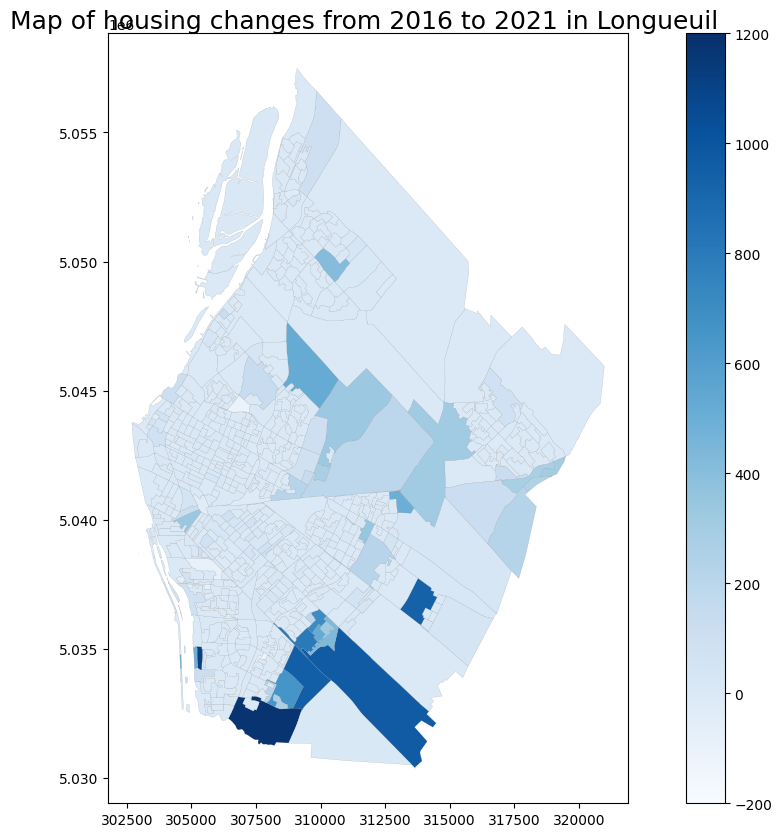

In [29]:
plot_final = promerged_da_lon.plot(
    'var_house'
    ,figsize=(15,10)
    ,edgecolor="grey"
    ,linewidth=0.1
    ,vmax=1200
    ,vmin=-200
    ,legend=True
    ,cmap="Blues"
)

plot_final.annotate(
    "Map of housing changes from 2016 to 2021 in Longueuil ",
    (0.5,1)
    ,xycoords = 'axes fraction'
    ,horizontalalignment='center'
    ,verticalalignment='bottom'
    ,fontsize = 18
    ,color='#000'
    ,fontstyle='normal'
)

Text(0.5, 1, 'Map of population changes from 2016 to 2021 in Montreal ')

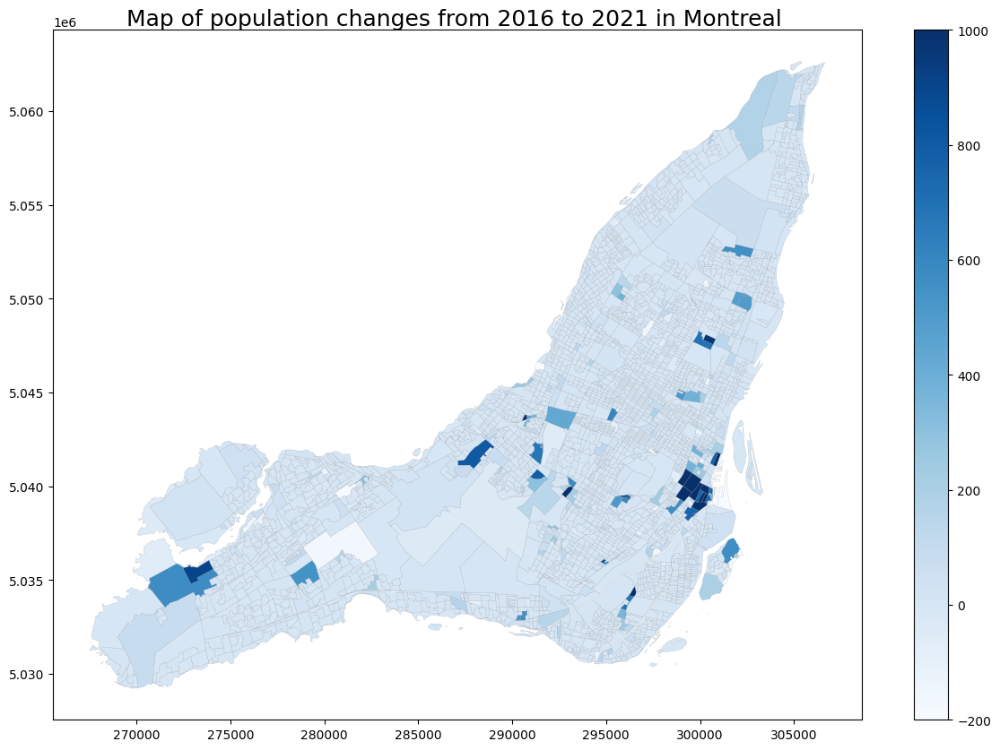

In [46]:
plot_final = promerged_da_mtl.plot(
    'var_house'
    ,figsize=(15,10)
    ,edgecolor="grey"
    ,linewidth=0.1
    ,vmax=1000
    ,vmin= -200
    ,legend=True
    ,cmap="Blues"
)

plot_final.annotate(
    "Map of population changes from 2016 to 2021 in Montreal ",
    (0.5,1)
    ,xycoords = 'axes fraction'
    ,horizontalalignment='center'
    ,verticalalignment='bottom'
    ,fontsize = 18
    ,color='#000'
    ,fontstyle='normal'
)

In [253]:
# mapping the areas with the most new houses
# tiles='CartoDB positron'
merged_da_lon.explore(column="var_house", cmap="Reds" ,legend=None,tooltip=['DAUID','var_house'], style_kwds={"color": "black", "weight":1, "opacity":0.8})


In [255]:
# mapping the areas with the most new houses
# tiles='CartoDB positron'
merged_da_mtl.explore(column="var_house", cmap="Blues" ,legend=None,tooltip=['DAUID','var_house'], style_kwds={"color": "black", "weight":1, "opacity":1})


Text(0.5, 1, 'Map of population changes from 2016 to 2021 in Montreal ')

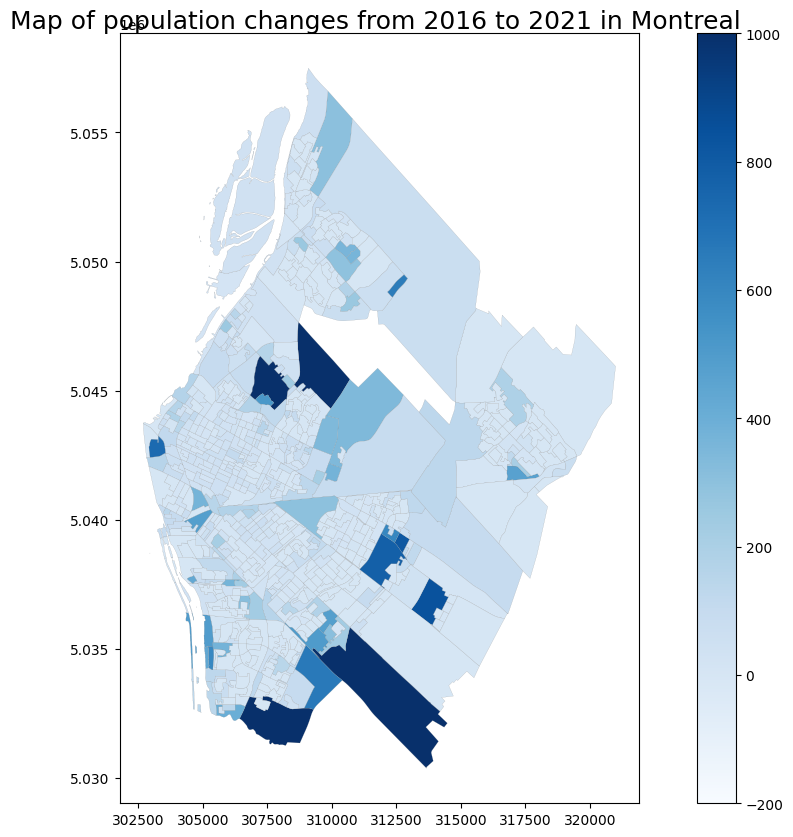

In [45]:
plot_final = promerged_da_lon.plot(
    'condo2021'
    ,figsize=(15,10)
    ,edgecolor="grey"
    ,linewidth=0.1
    ,vmax=1000
    ,vmin= -200
    ,legend=True
    ,cmap="Blues"
)

plot_final.annotate(
    "Map of population changes from 2016 to 2021 in Montreal ",
    (0.5,1)
    ,xycoords = 'axes fraction'
    ,horizontalalignment='center'
    ,verticalalignment='bottom'
    ,fontsize = 18
    ,color='#000'
    ,fontstyle='normal'
)

In [35]:
print('hello')

hello


## Discussion

blabla on results and what they mean, on possible further analysis possible

## References:

- reference 1
- reference 2

In [272]:
### Every code below is trial for now

In [113]:
# # remove first row of al dfs because it is the sum of all rows
# df_lon2016_data = df_lon2016[1:]
# df_lon2021_data = df_lon2021[1:]
# df_mtl2016_data = df_mtl2016[1:]
# df_mtl2021_data = df_mtl2021[1:]

In [72]:
# # reading the shapefile into a geodataframe for both years
# gdf_da2016 = gpd.read_file(shp2016_filenames[0])
# gdf_da2021 = gpd.read_file(shp2021_filenames[0])

In [269]:
# # # convert all DAUID into integers
# to_convert = {'DAUID': 'int64'} # for gdf where DAUID
# # to_convert2 = {'COL0': 'int64'} # for df where COL0 is the GEOUID
# # print(to_convert)
# gdf_da2016 = gdf_da2016.astype(to_convert)
# gdf_da2021 = gdf_da2021.astype(to_convert)
# # df_lon2016 = df_lon2016_data.astype(to_convert2)
# # df_lon2021 = df_lon2021_data.astype(to_convert2)
# # df_mtl2016 = df_mtl2016_data.astype(to_convert2)
# # df_mtl2021 = df_mtl2021_data.astype(to_convert2)
# # # verify types with one gdf and the rest should be good as well
# # gdf_da2016.dtypes

In [115]:
# # rename columns of all dfs to DAUID to be compatible for merge with the boundary shapefiles
# df_lon2016.rename(columns={"COL0": "DAUID"}, inplace = True)
# df_lon2021.rename(columns={"COL0": "DAUID"}, inplace = True)
# df_mtl2016.rename(columns={"COL0": "DAUID"}, inplace = True)
# df_mtl2021.rename(columns={"COL0": "DAUID"}, inplace = True)


In [116]:
# # merge both df_pop and gdf_da but first we need to make sure data in df_pop geouid is integer
# gdf_lon2016 = pd.merge(gdf_da2016, df_lon2016, how = 'inner', on = 'DAUID')
# gdf_lon2021 = pd.merge(gdf_da2021, df_lon2021, how = 'inner', on = 'DAUID')
# gdf_mtl2016 = pd.merge(gdf_da2016, df_mtl2016, how = 'inner', on = 'DAUID')
# gdf_mtl2021 = pd.merge(gdf_da2021, df_mtl2021, how = 'inner', on = 'DAUID')


In [117]:
# # # project all the gdfs merged into MTM zone 8 using .to_crs('EPSG:2950')
# gdf_lon2016_proj = gdf_lon2016.to_crs('EPSG:2950')
# gdf_lon2021_proj = gdf_lon2021.to_crs('EPSG:2950')
# gdf_mtl2016_proj = gdf_mtl2016.to_crs('EPSG:2950')
# gdf_mtl2021_proj = gdf_mtl2021.to_crs('EPSG:2950')

In [107]:
# # #exporting the projected merged gdfs as a Geojson file
# # proj_merged_gdf.to_file('dataframe.geojson', driver="GeoJSON")  
# gdf_lon2016_proj.to_file('gdf_lon2016_geojson.geojson', driver = 'GeoJSON')
# gdf_lon2021_proj.to_file('gdf_lon2021_geojson.geojson', driver = 'GeoJSON')
# gdf_mtl2016_proj.to_file('gdf_mtl2016_geojson.geojson', driver = 'GeoJSON')
# gdf_mtl2021_proj.to_file('gdf_mtl2021_geojson.geojson', driver = 'GeoJSON')

In [270]:
# # rename all columns for gdfs 2016 by using a for loop
# all_gdfs2016= (gdf_lon2016_proj, gdf_mtl2016_proj)
# for i in all_gdfs2016:
#     i.rename(columns={'COL0': 'DAUID','COL2': 'pop2011','COL3': 'pop2016','COL4': 'perc_change2011_2016','COL5': 'totalhomes2016','COL6': 'popdensity_km2_2016',
#                       'COL7': 'landarea_km2_2016','COL8': 'tot_citizen_stat2016','COL9': 'tot_can','COL10': 'tot_non_can','COL11': 'tot_homeownrent',
#                       'COL12': 'homeowner','COL13': 'homerenter','COL14': 'tot_condostatus','COL15': 'non_condo','COL16': 'condo',
#                       'COL17': 'tot_responsible','COL18': 'respon15_24','COL19': 'respons25_34','COL20': 'respons35_44','COL21': 'respons45_54',
#                       'COL22': 'respons55_64','COL23': 'respons65_74','COL24': 'respons75_84','COL25': 'respons85over'}, inplace = True)
# # use .columns to verify title of columns of gdf
# gdf_mtl2016_proj.columns

In [271]:
# # rename all columns for gdfs 2016 by using a for loop
# all_gdfs2021= (gdf_lon2021_proj, gdf_mtl2021_proj)
# for j in all_gdfs2021:
#     j.rename(columns={'COL0': 'DAUID','COL2': 'pop2021','COL3': 'pop2016','COL4': 'perc_change2021_2016','COL5': 'totalhomes','COL6': 'popdensity_km2',
#                       'COL7': 'landarea_km2','COL8': 'tot_citizen_stat','COL9': 'tot_can','COL10': 'tot_non_can','COL11': 'tot_homeownrent',
#                       'COL12': 'homeowner','COL13': 'homerenter','COL14': 'tot_condostatus','COL15': 'non_condo','COL16': 'condo',
#                       'COL17': 'tot_responsible','COL18': 'respon15_24','COL19': 'respons25_34','COL20': 'respons35_44','COL21': 'respons45_54',
#                       'COL22': 'respons55_64','COL23': 'respons65_74','COL24': 'respons75_84','COL25': 'respons85over'}, inplace = True)
# # verify with .columns the title of the columns
# gdf_mtl2021_proj.columns

In [123]:
# create new columns to see trends


# percSingHouse = (proj_merged_gdf['single_house'])/(proj_merged_gdf['house_total'])
# proj_merged_gdf['percSingHouse'] = percSingHouse
# proj_merged_gdf.head()

In [265]:
# fig, ax = mpl.pyplot.subplots(figsize=(30, 30)) #let's make it bigger too
# gdf_find.plot(column = 'pop2016', ax = ax, cmap='viridis')

In [266]:
# gdf_find = proj_merged_gdf.loc[proj_merged_gdf['DAUID'] == 24660054]
# gdf_find.explore(column='percSingH
# ouse', cmap="Blues", legend=None, tooltip=['DAUID', 'house_total','pop2016'], style_kwds={"color": "black", "weight":1, "opacity":1})

In [ ]:
# fig, ax = matplotlib.pyplot.subplots(figsize=(30, 30)) #let's make it bigger too
# gdf_da.plot(column = 'percLowInc', ax = ax, cmap='viridis')

In [267]:
# proj_merged_gdf.explore(column='percSingHouse', cmap="Blues", legend=None, tooltip=['DAUID', 'house_total','pop2016'], style_kwds={"color": "black", "weight":1, "opacity":1})

In [268]:
# fig, ax = mpl.pyplot.subplots(figsize = (30,30))
# proj_merged_gdf.plot(column = 'percSingHouse', ax = ax, cmap = 'viridis')